In [49]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

In [50]:
missions = pd.read_csv("space_missions_dataset.csv")

In [51]:
missions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Mission ID                         500 non-null    object 
 1   Mission Name                       500 non-null    object 
 2   Launch Date                        500 non-null    object 
 3   Target Type                        500 non-null    object 
 4   Target Name                        500 non-null    object 
 5   Mission Type                       500 non-null    object 
 6   Distance from Earth (light-years)  500 non-null    float64
 7   Mission Duration (years)           500 non-null    float64
 8   Mission Cost (billion USD)         500 non-null    float64
 9   Scientific Yield (points)          500 non-null    float64
 10  Crew Size                          500 non-null    int64  
 11  Mission Success (%)                500 non-null    float64

In [52]:
missions.tail(5)

,Mission ID,Mission Name,Launch Date,Target Type,Target Name,Mission Type,Distance from Earth (light-years),Mission Duration (years),Mission Cost (billion USD),Scientific Yield (points),Crew Size,Mission Success (%),Fuel Consumption (tons),Payload Weight (tons),Launch Vehicle
495,MSN-0496,Mission-496,2034-06-28,Planet,Betelgeuse,Colonization,48.26,25.3,274.82,91.2,64,96.2,4837.16,44.97,Ariane 6
496,MSN-0497,Mission-497,2034-07-05,Asteroid,Betelgeuse,Exploration,0.35,4.1,379.71,82.6,61,100.0,62.59,67.88,SLS
497,MSN-0498,Mission-498,2034-07-12,Planet,Ceres,Exploration,47.60,26.6,296.45,98.6,29,100.0,4794.01,51.38,Falcon Heavy
498,MSN-0499,Mission-499,2034-07-19,Planet,Betelgeuse,Research,31.99,18.0,457.38,77.9,39,100.0,3102.16,86.28,SLS
499,MSN-0500,Mission-500,2034-07-26,Planet,Io,Exploration,43.41,23.5,449.40,45.4,88,100.0,4302.93,86.74,Falcon Heavy


In [53]:
# Feature Editing and Preprocessing
missions['Target_Type_Code'] = missions['Target Type'].astype('category').cat.codes
missions['Mission_Type_Code'] = missions['Mission Type'].astype('category').cat.codes
missions['Launch_Vehicle_Code'] = missions['Launch Vehicle'].astype('category').cat.codes
missions['Target_Name_Code'] = missions['Target Name'].astype('category').cat.codes
missions['Mission_ID_Code'] = missions['Mission ID'].str.replace('MSN-', '', regex=True).astype(int)
missions['Launch Year'] = pd.to_datetime(missions['Launch Date']).dt.year

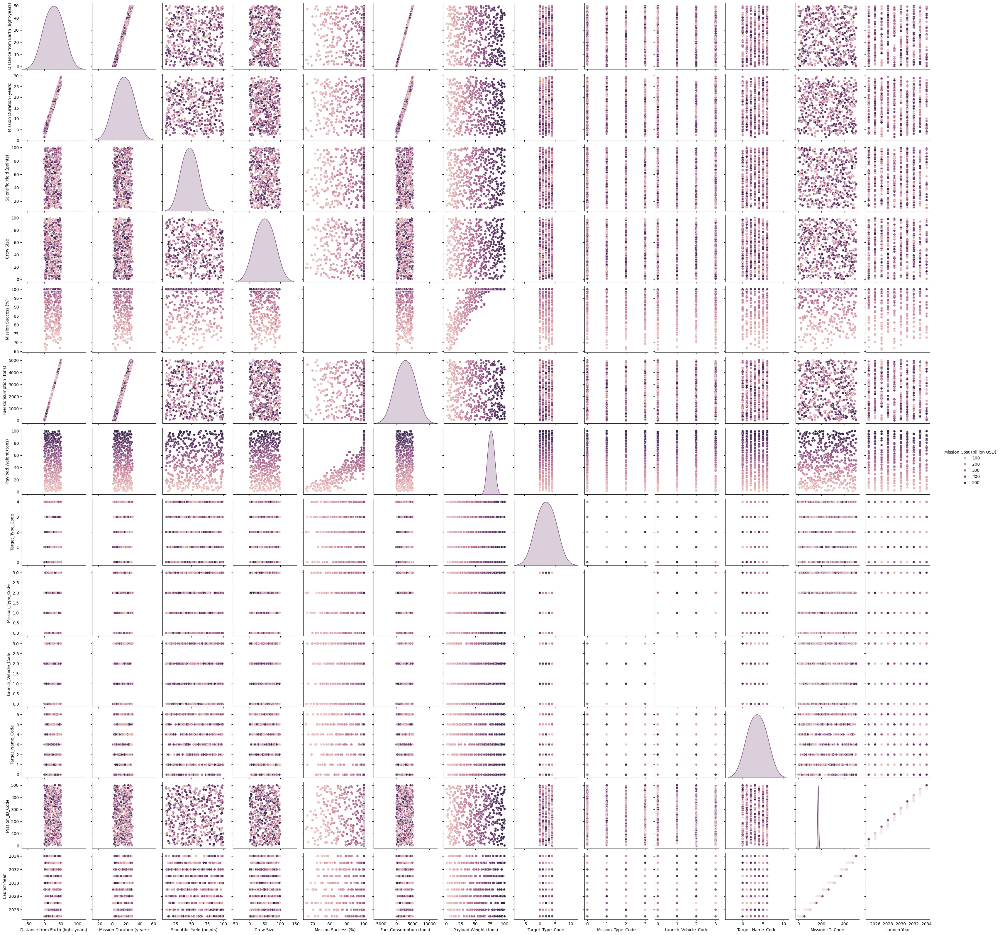

In [54]:
# Feature Correlation using Pairplot
sns.pairplot(missions, hue="Mission Cost (billion USD)")

## PairPlot Analysis:

As seen from the pairplot, the two main features driving and separating the target feature hue "Mission Cost" might be "Payload Weigth" and "Mission Success." 

However, using the latter would result in something called "Data Leakage" as "Mission Success" is a post-mission feature and cannot be used as a pre-mission feature to predict the costs. At the same time, it seems that using "Payload Weight" as a feature might result in "Over-fitting" the model as it correlates a lot with the target compared to other features. But "Payload Weight" is indeed an important feature when it comes to determining a space-ship's cost. So let's see what we can do with Feature Engineering!

In [55]:
# Feature Engineering
missions['Time Efficiency'] = missions['Scientific Yield (points)'] / (missions['Mission Duration (years)'] + 1e-5)
missions['Energy Demand'] = missions['Payload Weight (tons)'] * missions['Distance from Earth (light-years)']
missions['Target Distance'] = missions['Target_Name_Code'] * missions['Distance from Earth (light-years)']

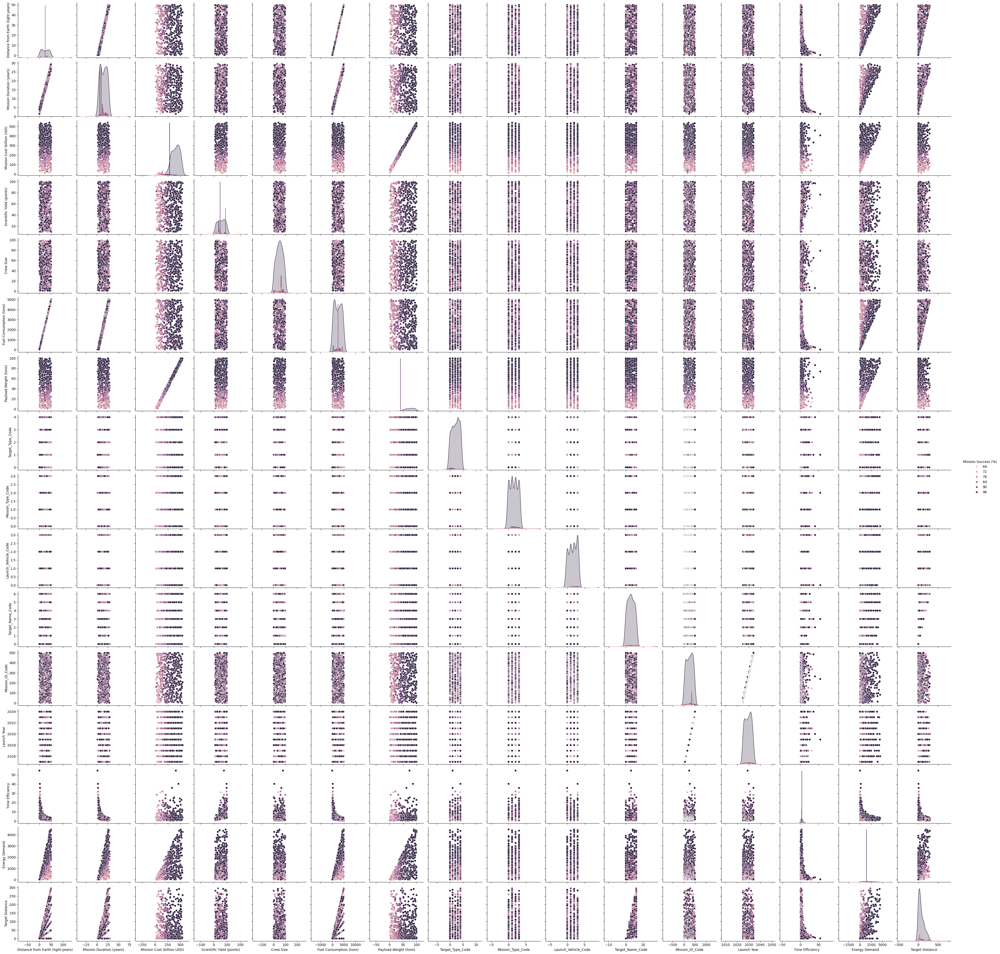

In [56]:
# Feature Correlation using Pairplot
sns.pairplot(missions, hue="Mission Success (%)")

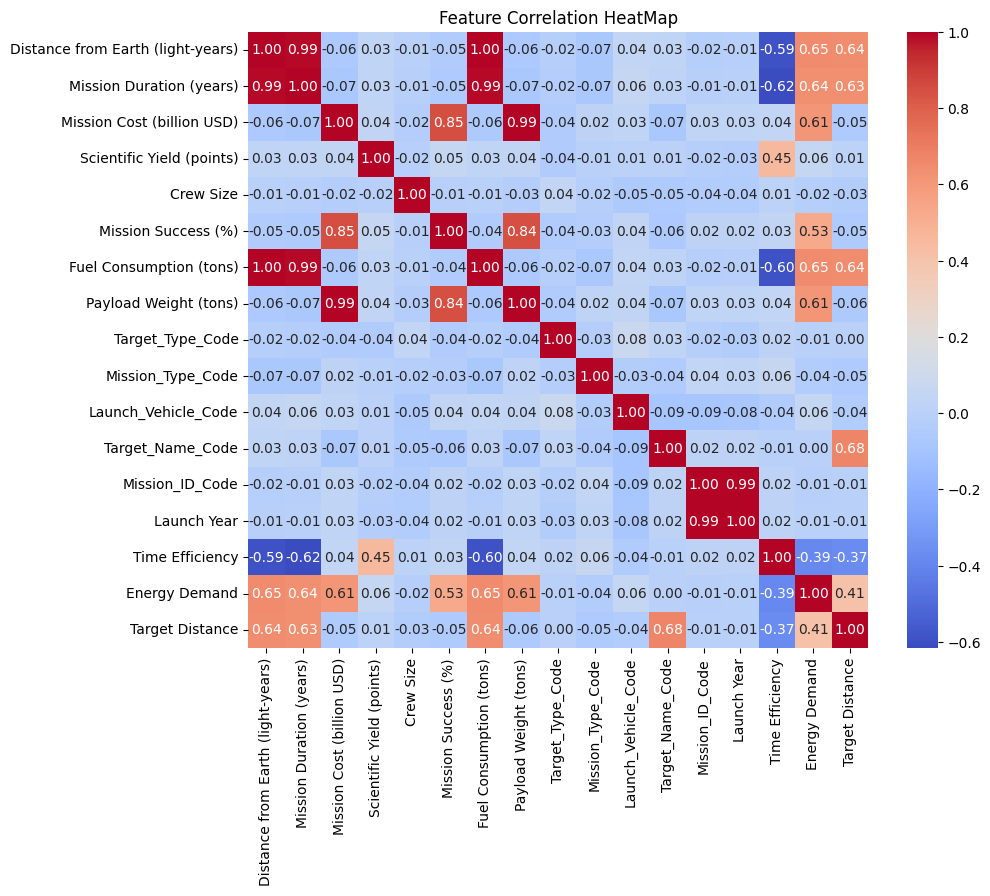

In [57]:
# Feature Correlation using HeatMap
numeric_columns = missions.select_dtypes(include=['number'])
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Feature Correlation HeatMap')
plt.show()

## PairPlot and HeatMap Analysis:

As seen from the Heatmap and the PairPlot, "Payload Weight" seems to be a pretty dominating feature compared to other available features. Hence, moving forward with this notebook, we want to analyze the model prediction strength using features except the "Payload Weight". Please refer to the "   " notebook in the same directory or folder where we analyze the role of this feature and try to reduce its influence on the model using Ridge Regression.  

In [58]:
features = ['Target Distance', 'Time Efficiency', 'Energy Demand', 'Distance from Earth (light-years)', 'Mission Duration (years)', 'Scientific Yield (points)', 'Target_Type_Code', 'Mission_Type_Code', 'Launch_Vehicle_Code', 'Target_Name_Code', 'Mission_ID_Code', 'Launch Year', 'Crew Size', 'Fuel Consumption (tons)', ]
target = 'Mission Cost (billion USD)'
missions[features] = StandardScaler().fit_transform(missions[features])

In [59]:
X = missions[features]
y = missions[target]

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [68]:
tree = DecisionTreeRegressor(random_state = 42)
tree.fit(X_train, y_train)

y_pred_tree = tree.predict(X_test)

In [69]:
forest = RandomForestRegressor(random_state = 42)
forest.fit(X_train, y_train.values.ravel())

y_pred_forest = forest.predict(X_test)
mse = mean_squared_error(y_test, y_pred_forest)
rmse = np.sqrt(mse)
print("Random Forest RMSE: ", rmse)

Random Forest RMSE:  54.85426071453066


In [71]:
print("R2 score: ", r2_score(y_test, y_pred_forest) * 100, "%")
print("MAPE: ", mean_absolute_percentage_error(y_test, y_pred_forest) * 100, "%")

R2 score:  87.11047158310234 %
MAPE:  19.764111855063543 %


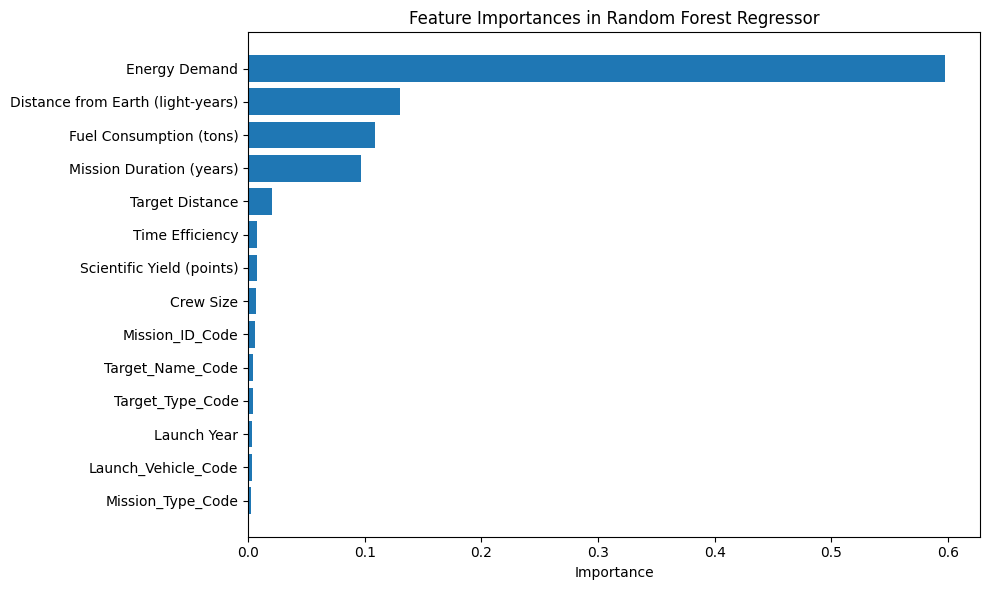

In [64]:
importances = forest.feature_importances_
feature_names = X.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot the graph
plt.figure(figsize=(10, 6))
plt.barh(range(len(importances)), importances[indices])
plt.yticks(range(len(importances)), [feature_names[i] for i in indices])
plt.xlabel('Importance')
plt.title('Feature Importances in Random Forest Regressor')
plt.gca().invert_yaxis()  # Most important at the top
plt.tight_layout()
plt.show()

In [65]:
xg_reg = xgb.XGBRegressor(objective='reg:squarederror',
                          max_depth=5, learning_rate=0.1,
                          n_estimators=100, reg_lambda=1.0,
                          random_state=42)
xg_reg.fit(X_train, y_train)

y_pred_xgb = xg_reg.predict(X_test)

In [66]:
print("R² Score:", r2_score(y_test, y_pred_xgb) * 100, "%")
print("MAPE:", mean_absolute_percentage_error(y_test, y_pred_xgb) * 100, "%")

R² Score: 90.97402840918294 %
MAPE: 16.712344045033063 %


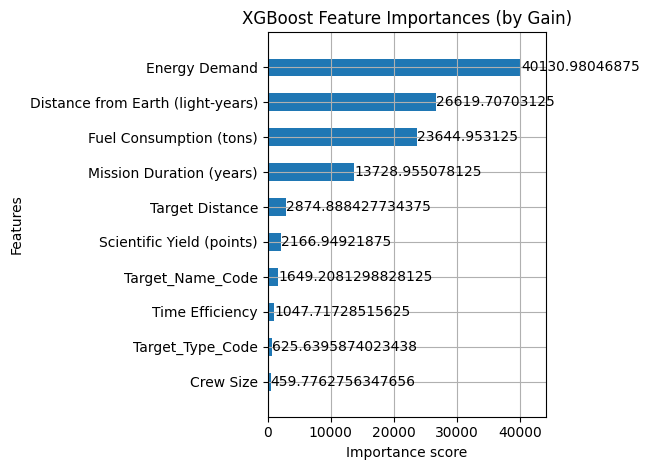

In [67]:
# Plot importance (default: 'weight' = number of times a feature appears)
xgb.plot_importance(xg_reg, importance_type='gain', max_num_features=10, height=0.5)
plt.title("XGBoost Feature Importances (by Gain)")
plt.tight_layout()
plt.show()

## Final Analysis:

As seen from the Feature Importance barplot, some features tend to be very influential in predicting the model whereas others are not. We have also used XGBoost (Gradient Boosting) on our ensembled model to improve its performance and reduce overfitting, perhaps, caused by one feature in the model. It trains the model by learning the errors from previous Decision Trees and then training the Decision Trees further based on the error corrrection. This helped in improving the prediction score and we achieved a ~91% R2 score in the end.